In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import tensorflow as tf
import pandas as pd
import numpy as np
import altair as alt

from path_explain.path_explainer_tf import PathExplainerTF
from path_explain import utils
from plot.scatter import scatter_plot
from plot.summary import summary_plot
import shap
import sklearn.model_selection

In [3]:
utils.set_up_environment(visible_devices='0')

In [4]:
x = pd.read_csv('X.csv')
y = np.load('y.npy')
x_train, x_test, y_train, y_test = sklearn.model_selection.train_test_split(x, y, test_size=0.2, random_state=12)
x_train_train, x_train_valid, y_train_train, y_train_valid = sklearn.model_selection.train_test_split(x_train, y_train, test_size=0.2, random_state=27)

In [5]:
y_train = tf.keras.utils.to_categorical((y_train > 0).astype(int))
y_test = tf.keras.utils.to_categorical((y_test > 0).astype(int))
y_train_train = tf.keras.utils.to_categorical((y_train_train > 0).astype(int))
y_train_valid = tf.keras.utils.to_categorical((y_train_valid > 0).astype(int))

In [6]:
mu = x_train.mean()
sigma = x_train.var()**0.5

for df in [x, x_train, x_train_train, x_train_valid, x_test]:
    df -= mu
    for col in sigma.index:
        if sigma[col] != 0:
            df[col] /= sigma[col]
    df.fillna(0, inplace=True)

/homes/gws/psturm/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/homes/gws/psturm/miniconda3/lib/python3.7/site-packages/pandas/core/frame.py:4259: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  **kwargs


In [7]:
try:
    model = tf.keras.models.load_model('model.h5')
except OSError:
    model = tf.keras.models.Sequential()
    model.add(tf.keras.layers.Dense(100, input_dim=x_train_train.shape[1], activation=tf.keras.activations.softplus))
    model.add(tf.keras.layers.Dropout(0.5))
    model.add(tf.keras.layers.Dense(100, activation=tf.keras.activations.softplus))
    model.add(tf.keras.layers.Dropout(0.5))
    model.add(tf.keras.layers.Dense(100, activation=tf.keras.activations.softplus))
    model.add(tf.keras.layers.Dropout(0.5))
    model.add(tf.keras.layers.Dense(100, activation=tf.keras.activations.softplus))
    model.add(tf.keras.layers.Dropout(0.5))
    model.add(tf.keras.layers.Dense(2, activation=None))
    model.add(tf.keras.layers.Softmax())

    model.compile(loss=tf.keras.losses.BinaryCrossentropy(),
                  optimizer=tf.keras.optimizers.RMSprop(),
                  metrics=[tf.keras.metrics.BinaryAccuracy(), tf.keras.metrics.AUC()])

    history = model.fit(x_train_train, y_train_train, epochs=20, batch_size=128,
                        validation_data=(x_train_valid, y_train_valid), verbose=2,
                        class_weight={0: 0.5, 1: 1.0})
    tf.keras.models.save_model(model, 'model.h5')

In [8]:
score = model.evaluate(x_test, y_test, batch_size=128)
print("Test loss: {:.4f}, Test acc: {:.4f}, Test auc: {:.4f}".format(score[0], score[1], score[2]))

2882/2882 [==============================] - 0s 168us/sample - loss: 0.4907 - binary_accuracy: 0.8088 - auc_2: 0.8455
Test loss: 0.4907, Test acc: 0.8088, Test auc: 0.8455


In [9]:
pred_logits = model.predict(x_test.values)
pred_labels = (pred_logits > 0.5).astype(y_test.dtype)
index_survived = y_test[:, 1] == 1
accuracy_survived = np.sum(pred_labels[index_survived, 1] == y_test[index_survived, 1]) / np.sum(index_survived)
index_deceased = y_test[:, 0] == 1
accuracy_deceased = np.sum(pred_labels[index_deceased, 0] == y_test[index_deceased, 0]) / np.sum(index_deceased)
print('True positive rate (sensitivity): {:.4f}'.format(accuracy_survived))
print('True negative rate (specificity): {:.4f}'.format(accuracy_deceased))

True positive rate (sensitivity): 0.8184
True negative rate (specificity): 0.8042


In [10]:
model_without_softmax = tf.keras.Model(inputs=model.input,
                              outputs=model.layers[-2].output)

In [11]:
explainer = PathExplainerTF(model_without_softmax)

In [12]:
test_attributions = explainer.attributions(x_test.values,
                                           x_train.values,
                                           batch_size=200,
                                           num_samples=200,
                                           use_expectation=True,
                                           output_indices=1,
                                           verbose=True)

100%|██████████| 2882/2882 [00:50<00:00, 56.94it/s]


In [13]:
alt.data_transformers.disable_max_rows()

DataTransformerRegistry.enable('default')

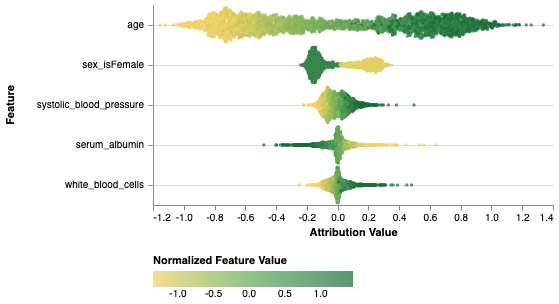

In [14]:
summary_plot(test_attributions,
             x_test.values,
             feature_names=list(x_test.columns),
             plot_top_k=5,
             standardize_features=False)

In [15]:
AGE, SEX, BP, ALBUMIN, SEDIMENT = np.argsort(np.mean(np.abs(test_attributions), axis=0))[::-1][:5].tolist()

In [16]:
age_interactions = explainer.interactions(x_test.values,
                                           x_train.values,
                                           batch_size=200,
                                           num_samples=200,
                                           use_expectation=True,
                                           output_indices=1,
                                           verbose=True,
                                           interaction_index=AGE)

100%|██████████| 2882/2882 [01:04<00:00, 44.71it/s]


In [17]:
sex_interactions = explainer.interactions(x_test.values,
                                           x_train.values,
                                           batch_size=200,
                                           num_samples=200,
                                           use_expectation=True,
                                           output_indices=1,
                                           verbose=True,
                                           interaction_index=SEX)

100%|██████████| 2882/2882 [01:04<00:00, 44.38it/s]


In [18]:
bp_interactions = explainer.interactions(x_test.values,
                                           x_train.values,
                                           batch_size=200,
                                           num_samples=200,
                                           use_expectation=True,
                                           output_indices=1,
                                           verbose=True,
                                           interaction_index=BP)

100%|██████████| 2882/2882 [01:02<00:00, 46.48it/s]


In [19]:
serum_albumin_interactions = explainer.interactions(x_test.values,
                                           x_train.values,
                                           batch_size=200,
                                           num_samples=200,
                                           use_expectation=True,
                                           output_indices=1,
                                           verbose=True,
                                           interaction_index=ALBUMIN)

100%|██████████| 2882/2882 [01:04<00:00, 44.52it/s]


In [20]:
sedimentation_interactions = explainer.interactions(x_test.values,
                                           x_train.values,
                                           batch_size=200,
                                           num_samples=200,
                                           use_expectation=True,
                                           output_indices=1,
                                           verbose=True,
                                           interaction_index=SEDIMENT)

100%|██████████| 2882/2882 [01:04<00:00, 44.51it/s]


In [21]:
np.save('test_attributions.npy', test_attributions)
np.save('age_interactions.npy', age_interactions)
np.save('sex_interactions.npy', sex_interactions)
np.save('bp_interactions.npy', bp_interactions)
np.save('serum_albumin_interactions.npy', serum_albumin_interactions)
np.save('sedimentation_interactions.npy', sedimentation_interactions)

### Attributions to the Age feature
This first plot displays interactions between age and sex.

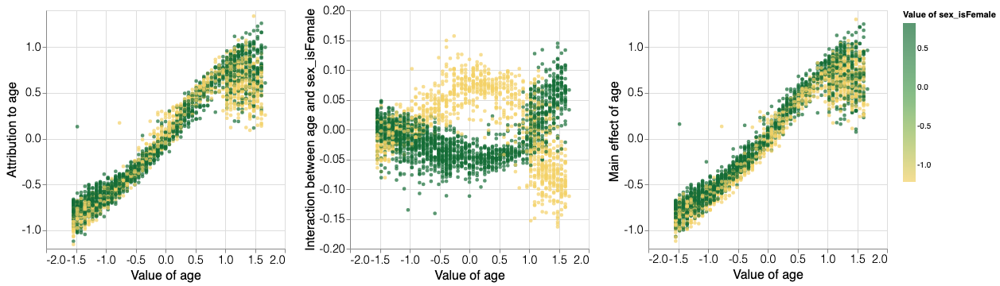

In [34]:
scatter_plot(test_attributions,
             x_test.values,
             feature_index=AGE,
             interactions=age_interactions,
             color_by=SEX,
             feature_names=x_test.columns)

## Attributions to Systolic Blood Pressure
This next plot displays interactions between age and blood pressure.

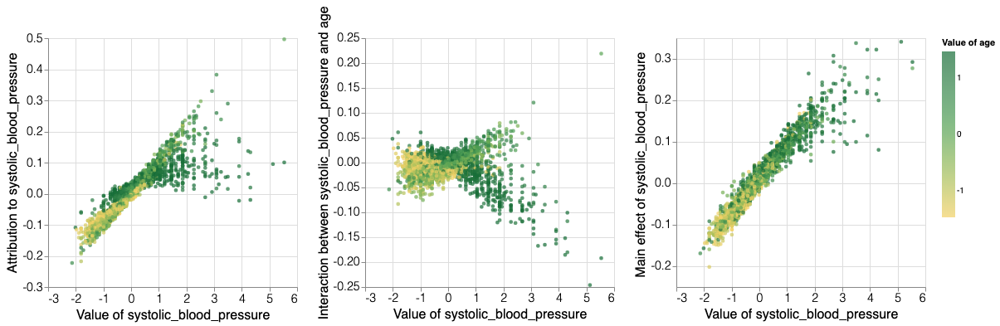

In [35]:
scatter_plot(test_attributions,
             x_test.values,
             feature_index=BP,
             interactions=bp_interactions,
             color_by=AGE,
             feature_names=x_test.columns)

There is also a clear interaction between blood pressure and sex:

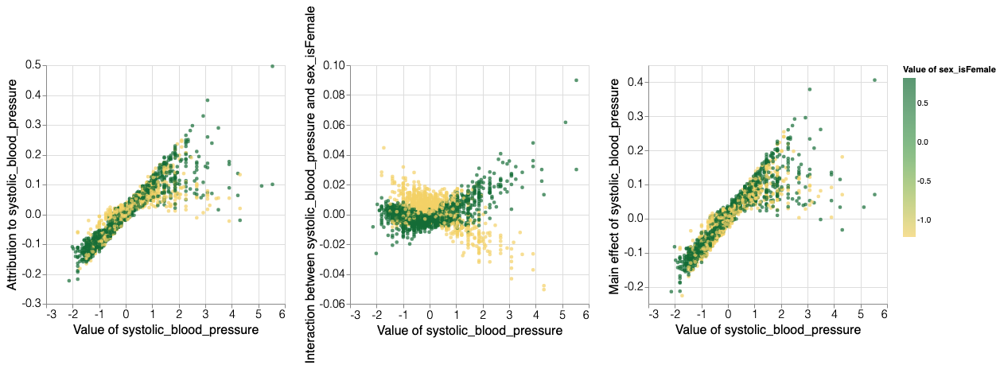

In [36]:
scatter_plot(test_attributions,
             x_test.values,
             feature_index=BP,
             interactions=bp_interactions,
             color_by=SEX,
             feature_names=x_test.columns)

### Attributions to Serum Albumin
We can look at interactions with serum albumin and age and blood pressure, respectively:

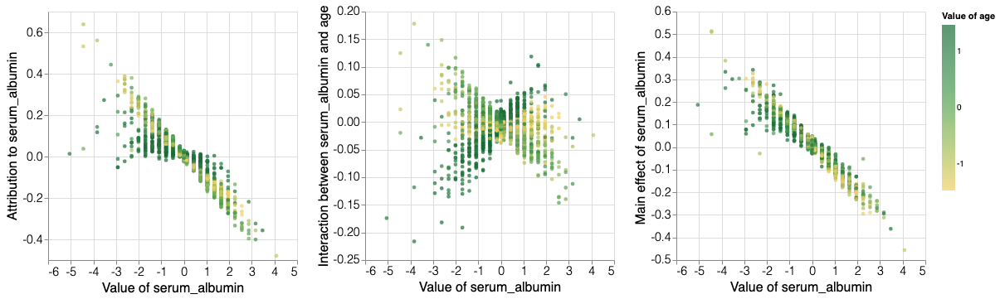

In [37]:
scatter_plot(test_attributions,
             x_test.values,
             feature_index=ALBUMIN,
             interactions=serum_albumin_interactions,
             color_by=AGE,
             feature_names=x_test.columns)

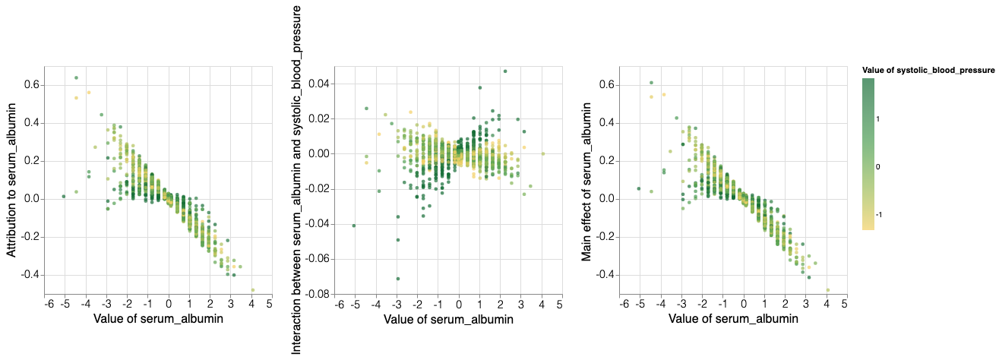

In [38]:
scatter_plot(test_attributions,
             x_test.values,
             feature_index=ALBUMIN,
             interactions=serum_albumin_interactions,
             color_by=BP,
             feature_names=x_test.columns)

### Attributions to Sedimentation Rate
Finally, lets look at the feature sedimentation rate and how it interacts with age:

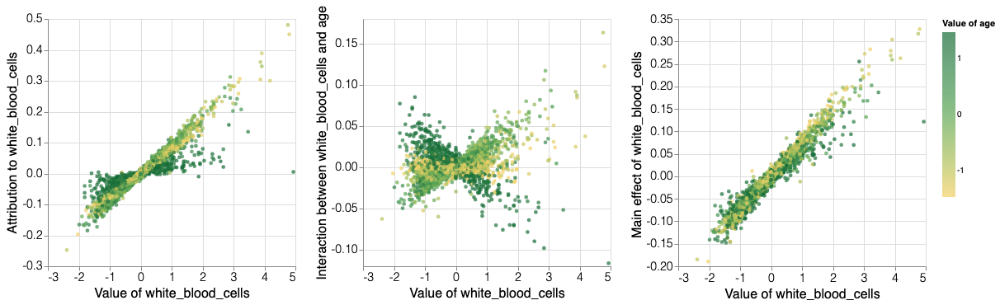

In [39]:
scatter_plot(test_attributions,
             x_test.values,
             feature_index=SEDIMENT,
             interactions=sedimentation_interactions,
             color_by=AGE,
             feature_names=x_test.columns)